In [2]:
import pysftp
import os 
import numpy as np
import pandas as pd
import netCDF4
import numpy as np

from scipy import io
from classes.matlab_reader import matlab_reader
from classes.grid_funcs import map_grid,dataset,data_wizard
from dotenv import load_dotenv   #for python-dotenv method
from datetime import datetime

/Users/joaojesus/opt/anaconda3/envs/geo_plotting/lib/python3.8/site-packages/paramiko/transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


In [3]:
import calendar

years = [year for year in range(2017,2021+1)]
months = [1, 2, 3, 4, 10, 11, 12]


dates = []
year_days_dict = {}
for year in years:
    days_per_month = []
    for month in months:
        days_in_month = calendar.monthrange(year, month)[1]
        days_per_month.append(days_in_month)
        total_days = sum(days_per_month)
        year_days_dict[year] = total_days

        for day in range(1, days_in_month + 1):
        # Create date object for the current day
            date_str = f'{day}/{month}/{year}'
            date_obj = datetime.strptime(date_str, '%d/%m/%Y')
            
            # Add the date object to the list
            dates.append(date_obj)


year_days_dict

{2017: 212, 2018: 212, 2019: 212, 2020: 213, 2021: 212}

In [4]:
dates[248]

datetime.datetime(2018, 2, 6, 0, 0)

In [5]:
ds = netCDF4.Dataset('DO_NOT_DELETE_era5_2017_2021.nc')

# np.savetxt("COORDINATES_ERA5_ONLINE/COORDINATES_ERA5_ONLINE_LON.csv", ds['longitude'], delimiter=",")
# np.savetxt("COORDINATES_ERA5_ONLINE/COORDINATES_ERA5_ONLINE_LAT.csv", ds['latitude'], delimiter=",")
np.shape(ds['u'])

(1061, 241, 1440)

In [6]:
# for i in range(np.shape(ds['u'])[0]):
#     potential_vorticity = ds['pv'][i] # POTENTIAL_VORTICITY
#     relative_humidity = ds['r'][i] # RELATIVE_HUMIDITY
#     specific_humidy = ds['q'][i] # SPECIFIC_HUMIDTY
#     temperature = ds['t'][i] # TEMPERATURE
#     wind_eastward = ds['u'][i] # WIND_EASTWARD
#     wind_northward = ds['v'][i] # WIND_NORTHWARD
#     vertical_velocity = ds['w'][i] # VERTICAL_VELOCITY

#     np.savetxt(f"PROCESSED_ERA5_ONLINE/POTENTIAL_VORTICITY/{dates[i].strftime(('%Y-%m-%d'))}.csv", potential_vorticity, delimiter=",")
#     np.savetxt(f"PROCESSED_ERA5_ONLINE/RELATIVE_HUMIDITY/{dates[i].strftime(('%Y-%m-%d'))}.csv", relative_humidity, delimiter=",")
#     np.savetxt(f"PROCESSED_ERA5_ONLINE/SPECIFIC_HUMIDTY/{dates[i].strftime(('%Y-%m-%d'))}.csv", specific_humidy, delimiter=",")
#     np.savetxt(f"PROCESSED_ERA5_ONLINE/TEMPERATURE/{dates[i].strftime(('%Y-%m-%d'))}.csv", temperature, delimiter=",")
#     np.savetxt(f"PROCESSED_ERA5_ONLINE/WIND_EASTWARD/{dates[i].strftime(('%Y-%m-%d'))}.csv", wind_eastward, delimiter=",")
#     np.savetxt(f"PROCESSED_ERA5_ONLINE/WIND_NORTHWARD/{dates[i].strftime(('%Y-%m-%d'))}.csv", wind_northward, delimiter=",")
#     np.savetxt(f"PROCESSED_ERA5_ONLINE/VERTICAL_VELOCITY/{dates[i].strftime(('%Y-%m-%d'))}.csv", vertical_velocity, delimiter=",")



In [16]:
# Get Temperature Data]
def generate_dataset(path='/Users/joaojesus/Desktop/final_year_proj/PROCESSED_ERA5_ONLINE/WIND_EASTWARD/',
                    geo_filtering = {'min_lat':55,'max_lat':65,'min_lon':-180, 'max_lon': 180},
                    year_selection = '2018',
                    data_name = 'wind_eastward'):
    
    grid = map_grid(grid_size=None, source = 'era5')
    wizard = data_wizard()
    res_mean = []
    res_mean_selection = []
    file_names = []
    for file in os.listdir(path):
        if file[:4] == year_selection: 
            temperature = np.loadtxt(path + file, delimiter=",")

            select_area_indexer = grid.select_area_indexer(
                min_lat= geo_filtering['min_lat'],
                max_lat= geo_filtering['max_lat'],
                min_lon= geo_filtering['min_lon'],
                max_lon= geo_filtering['max_lat'])

            data = wizard.data_filtering(select_area_indexer = select_area_indexer ,data = temperature)

            file_names.append(file[:10])
            res_mean.append(np.nanmean(temperature))
            res_mean_selection.append(np.nanmean(data))

    df = pd.DataFrame(data={
        'dates' : file_names,
        f'{data_name}_mean' : res_mean,
        f'{data_name}_mean_selection' : res_mean_selection
    })
    
    df['dates'] = pd.to_datetime(df['dates'])
    df = df.sort_values(by='dates')
    df = df.reset_index()
    df = df.drop(columns=['index'])

    return df

df_2018_wind = generate_dataset(path='/Users/joaojesus/Desktop/final_year_proj/PROCESSED_ERA5_ONLINE/WIND_EASTWARD/',
                    geo_filtering = {'min_lat':55,'max_lat':65,'min_lon':-180, 'max_lon': 180},
                    year_selection = '2018',
                    data_name = 'wind_eastward')

df_2018_temperature = generate_dataset(path='/Users/joaojesus/Desktop/final_year_proj/PROCESSED_ERA5_ONLINE/TEMPERATURE/',
                    geo_filtering = {'min_lat':55,'max_lat':65,'min_lon':-180, 'max_lon': 180},
                    year_selection = '2018',
                    data_name = 'temperature')

df = pd.merge(df_2018_wind,df_2018_temperature[['dates','temperature_mean_selection']],how='left', on='dates')

In [18]:

# Define the outlier threshold
outlier_threshold = df['wind_eastward_mean_selection'].mean() + (df['wind_eastward_mean_selection'].std() * 3)
df['outliers'] = df['wind_eastward_mean_selection'] > outlier_threshold

# Define a function to apply to each row of the DataFrame
def replace_outliers(row):
    if not row['outliers']:
        # If B is False, return the value of A
        return row['wind_eastward_mean_selection']
    else:
        # If B is True, replace the value of A with the average of the last 3 values of A
        last_3_avg = df.loc[:row.name, 'wind_eastward_mean_selection'].tail(5).mean()
        return last_3_avg

# Apply the function to each row of the DataFrame and store the result in a new column 'C'
df['res_filtered'] = df.apply(replace_outliers, axis=1)

values = df['res_filtered'].to_list()
SSW_ = [False]

for i in range(1,len(values)):
    if values[i-1] >= 0 and values[i] < 0:
        SSW_.append(True)
    else:
        SSW_.append(False)

df['SSW_'] = SSW_

df['SSW_flag'] = False
day_threshold = 7
for index in df[df['SSW_'] == True].index:
    if len(df.iloc[index:index+day_threshold].loc[df['res_filtered'] < -0.1]) >= day_threshold :
        df['SSW_flag'].iloc[index] = True

/var/folders/p6/325r0tsd2cd1jddpt9nd70hm0000gn/T/ipykernel_16747/2805233781.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['SSW_flag'].iloc[index] = True


In [19]:
df.head(3)

,dates,wind_eastward_mean,wind_eastward_mean_selection,temperature_mean_selection,outliers,res_filtered,SSW_,SSW_flag
0,2018-01-01,30.842482,28.413340,194.275679,False,28.413340,False,False
1,2018-01-02,30.206856,20.928544,192.088434,False,20.928544,False,False
2,2018-01-03,29.902171,21.215392,193.329079,False,21.215392,False,False


In [26]:
import plotly.graph_objects as go

# Create figure and plot the DataFrame
fig = go.Figure()
# fig.add_trace(go.Scatter(x=df['dates'], y=df['res_filtered'].rolling(3).mean(), name='Res Filtered', mode='markers', marker=dict(color='blue', size=2)))
fig.add_trace(go.Scatter(x=df['dates'], y=df['res_filtered'].rolling(3).mean(), name='Res Filtered', line=dict(color='blue')))
# fig.add_trace(go.Scatter(x=df['dates'], y=df['temperature_mean_selection'], name='Temperature Selection Mean', mode='markers', marker=dict(color='orange', size=3), yaxis='y2'))
fig.add_trace(go.Scatter(x=df['dates'], y=df['temperature_mean_selection'].rolling(3).mean(), name='Temperature Selection Mean', line=dict(color='orange'), yaxis='y2'))

# Add a dashed line at y=0
fig.add_shape(type='line', x0=df['dates'].min(), y0=0, x1=df['dates'].max(), y1=0, line=dict(color='gray', dash='dash'))

# Find the index of the first negative value
first_negative_index = (df['res_filtered'] < 0).idxmin()

# Add vertical lines for SSW_flag == True
for i, row in df.iterrows():
    if row.SSW_flag == True:
        fig.add_shape(type='line', x0=row.dates, y0=-50, x1=row.dates, y1=50, line=dict(color='red', dash='dash'))

# Set layout
fig.update_layout(
    yaxis=dict(
        range=[-50, 80],
        title='Res Filtered'
    )
    ,yaxis2=dict(
        range=[200, 250],
        title='Temperature Selection Mean',
        side='right',
        overlaying='y'
    )
    ,xaxis=dict(title='Dates'),
    title=f'ZMZW at 60◦ N latitude in 2018',
    legend=dict(orientation="h", y=1.2, x=0.5)
)

# Show the plot
fig.show()

In [163]:
wind_eastward = ds['u']
wind_eastward_SSW = wind_eastward[248]
wind_eastward = ds['t']
wind_eastward_NON_SSW = wind_eastward[600]

grid = map_grid(grid_size=None, source = 'era5_online')
wizard = data_wizard()

select_area_indexer = grid.select_area_indexer(
    min_lat= 60,
    max_lat= 90,
    min_lon= -180,
    max_lon= 180)

data = wizard.data_filtering(select_area_indexer = select_area_indexer ,data = wind_eastward_SSW)
data_non_ssw = wizard.data_filtering(select_area_indexer = select_area_indexer ,data = wind_eastward_NON_SSW)

/var/folders/p6/325r0tsd2cd1jddpt9nd70hm0000gn/T/ipykernel_13668/4292194347.py:12: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.

/var/folders/p6/325r0tsd2cd1jddpt9nd70hm0000gn/T/ipykernel_13668/4292194347.py:22: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.

/var/folders/p6/325r0tsd2cd1jddpt9nd70hm0000gn/T/ipykernel_13668/4292194347.py:28: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolorme

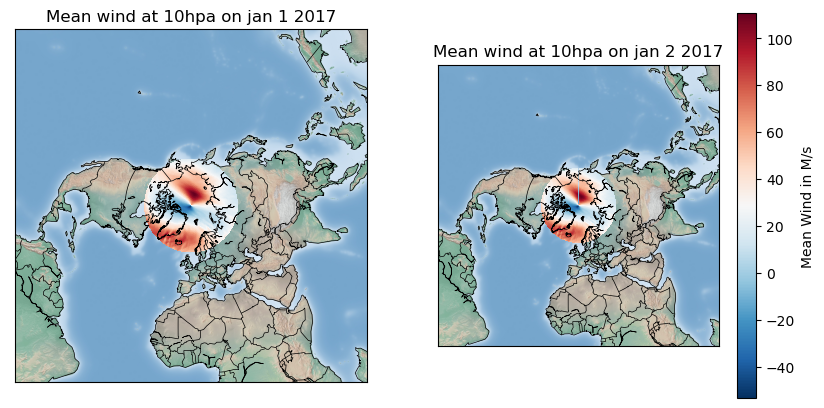

In [164]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Create a figure with two subplots
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Plot the first figure on the left subplot
m1 = Basemap(projection='npstere',boundinglat=0,lon_0=0,resolution='c', ax=axs[0])
m1.shadedrelief(scale=0.5)
m1.pcolormesh(grid.grid_[0], grid.grid_[1], data,latlon=True, cmap='RdBu_r',shading='auto')

m1.drawcoastlines(linewidth=0.5,linestyle='solid')
m1.drawcountries(linewidth=0.5, linestyle='solid',color='k')
axs[0].set_title('Mean wind at 10hpa on jan 1 2017')


# Plot the second figure on the right subplot
m2 = Basemap(projection='npstere',boundinglat=0,lon_0=0,resolution='c', ax=axs[1])
m2.shadedrelief(scale=0.5)
m2.pcolormesh(grid.grid_[0], grid.grid_[1], data_non_ssw,latlon=True, cmap='RdBu_r',shading='auto')

m2.drawcoastlines(linewidth=0.5,linestyle='solid')
m2.drawcountries(linewidth=0.5, linestyle='solid',color='k')

axs[1].set_title('Mean wind at 10hpa on jan 2 2017')
plt.colorbar(mappable=m2.pcolormesh(grid.grid_[0], grid.grid_[1],
data,latlon=True,
cmap='RdBu_r',
shading='auto'), ax=axs[1], label='Mean Wind in M/s')

plt.show()

/var/folders/p6/325r0tsd2cd1jddpt9nd70hm0000gn/T/ipykernel_13668/429646658.py:15: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



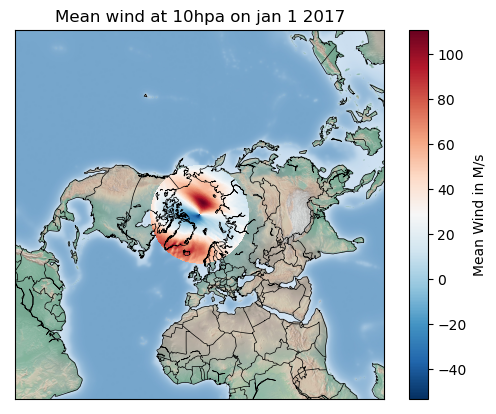

In [165]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

fig = plt.figure()

m = Basemap(projection='npstere',boundinglat=0,lon_0=0,resolution='c')
m.shadedrelief(scale=0.5)

# use to plot areas in any section of the globe using a stereographic projection
# m = Basemap(projection='stere',llcrnrlat=-80,urcrnrlat=80,\
#             llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')

m.pcolormesh(grid.grid_[0], grid.grid_[1], data,latlon=True, cmap='RdBu_r',shading='auto')
m.drawcoastlines(linewidth=0.5,linestyle='solid')
m.drawcountries(linewidth=0.5, linestyle='solid',color='k')


plt.title(f'Mean wind at 10hpa on jan 1 2017')
plt.colorbar(label='Mean Wind in M/s')

In [185]:
import numpy as np
import plotly.graph_objs as go

# Define the data and the grid

# Define the map layout
layout = go.Layout(
    title=dict(
        text='Mean wind at 10hpa on jan 1 2017'
    )
)

# Define the map trace
map_trace = go.Scattermapbox(
    lat=grid.grid_[1].flatten(),
    lon=grid.grid_[0].flatten(),
    mode='markers',
    marker=dict(
        size=5,
        color=data.flatten(),
        colorscale='RdBu_r',
        cmin=np.min(data),
        cmax=np.max(data),
        colorbar=dict(
            title=dict(
                text='Mean Wind in M/s'
            )
        )
    )
)

# Create the figure
fig = go.Figure(data=[map_trace])
fig.update_layout(layout)
fig = fig.update_geos(projection_type="stereographic")
# Show the figure
fig.show()